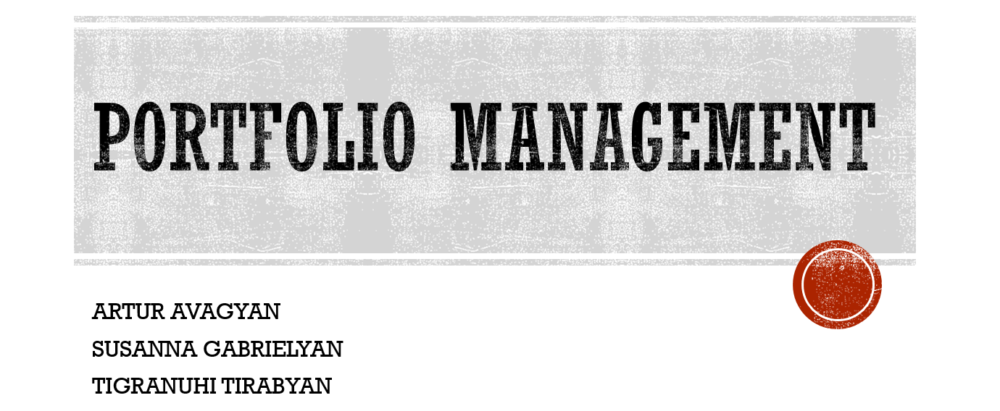

### Import libraries

In [1]:
import pandas as pd
import yfinance as yf
from yahoofinancials import YahooFinancials
import plotly.graph_objects as go
import plotly.express as px
import matplotlib.pyplot as plt
import numpy as np
import warnings
warnings.filterwarnings('ignore')
np.random.seed(42)

In [2]:
def create_line_chart(index_chart,
                      values_chart,
                      end_time):
    
    fig = go.Figure() # create figure
    fig.add_trace(go.Scatter(x=index_chart,
                             y=values_chart ) )

    fig.update_layout(
                    dict(title_text="Portfolio values (from 26/10/2021 - {})".format(end_time),
                         autosize=True,
                        )
                    )
    fig.show()

def create_all_line_chart(watch_list,
                          data,
                          start_time,
                          end_time):

    fig = go.Figure() # create figure
    for i in watch_list:
        fig.add_trace(go.Scatter(x=data.index, y=data[i], name = i) )

    fig.update_layout(
        dict(title_text="STOCK DATA (from {} - {})".format(start_time,end_time),
             autosize=True,
             yaxis_title='Close price')
                        )
    fig.show()

def growth_during_week(data_stock):
    data_sort = pd.DataFrame(100*(data_stock.iloc[-1, :-1]-data_stock.iloc[0, :-1]) / data_stock.iloc[0, :-1]).sort_values([0])
    data_sort['%'] = round(data_sort[0],2).astype(str) + ' %'

    fig = px.bar(data_sort, y = data_sort.index, x = 0, text = data_sort['%'], color=data_sort[0],
                color_continuous_scale='oranges')
    fig.update_layout(
                dict(title_text="Stock rate of return (from {}  to  {})".format(str(data_stock.index[0])[:-9],
                                                                             str(data_stock.index[-1])[:-9]),
                     autosize=True,
                     yaxis_title=None,
                     xaxis_title=None,))
    fig.update_coloraxes(showscale=False)
    fig.show()

def portfolio_df(start_time,
                 end_time,
                 stock_list,
                 count_stock):

    watch_list_df = yf.download(stock_list,
                                start=start_time,
                                end=end_time,
                                progress=False)

    watch_list_df = watch_list_df['Close']
    
    watch_list_df = watch_list_df.reindex(columns=stock_list)
    
    watch_list_df['Portfolio'] = (watch_list_df*count_stock.values()).sum(1)

    return watch_list_df

def description_portfolio(watch_list,
                          data_portfolio,
                          count_stock):
    for i in watch_list:

        print("Price of {} in {} is ----> {}".format(i,
                                                     str(data_portfolio.index[-1])[:10],
                                                     round(data_portfolio[i][-1],3)))
        weight_i = count_stock[i] * data_portfolio[i][-1] / data_portfolio.iloc[-1, -1]
        print("Weight of {} in our portfolio is ----> {}".format(i, round(weight_i,4)))
        print("Overall value of {} in our portfolio is ----> {}".format(i,
              round(data_portfolio[i][-1]*count_stock[i], 3)))
        print("Count of {} stock is ----> {}".format(i, round(count_stock[i],3)))
        print('\n##################################################\n')

def create_line_chart_port(watch_list_port,
                      start_time,
                      end_time):


    watch_df_port = yf.download(watch_list_port,
                       start=start_time,
                       end=end_time,
                       progress=False,
                       )
    watch_df_port = watch_df_port['Close']


    fig = go.Figure() # create figure
    for i in watch_list_port:
        fig.add_trace(go.Scatter(x=watch_df_port.index,
                                 y=watch_df_port[i],
                                 name = i) )

    fig.update_layout(
                dict(title_text="Our stocks data",
                     autosize=True,
                     yaxis_title='Close price')
                    )
    fig.show()

def create_others_price(all_watch_list,
                        portfolio_list,
                        start_time,
                        end_time):
    watch_list_others = [s for s in all_watch_list if s not in portfolio_list]


    watch_df_others = yf.download(watch_list_others,
                           start=start_time,
                           end=end_time,
                           progress=False,
                           )
    watch_df_others  = watch_df_others ['Close']

    create_all_line_chart(watch_list = watch_list_others,
                          data = watch_df_others,
                          start_time = watch_df_others.index[0],
                          end_time = watch_df_others.index[-1])

def price_stock_in_date(stock, date_price):


    watch_df = yf.download(stock,
                           start=date_price,
                           end=date_price,
                           progress=False,
                           )
    watch_df = watch_df['Close']
    return watch_df.values[0]

### Load data from Yahoo Finance during 25/10/2018 - 26/10/2020

In [3]:
watch_list = ["AMZN", "C", "AAPL", "IBM", "CSCO",
              "NVDA", "MSFT", "TM", "CVX", "GOOG",
              "FB", "TSLA", "JPM", "JNJ", "BAC",
              "RLLCF", "WMT", "MA", "V", "DIS", "PG"]


watch_df = yf.download(watch_list,
                       start='2018-10-26',
                       end='2021-10-27',
                       progress=False,
                       )['Close']
watch_df

,AAPL,AMZN,BAC,C,CSCO,CVX,DIS,FB,GOOG,IBM,...,JPM,MA,MSFT,NVDA,PG,RLLCF,TM,TSLA,V,WMT
Date,,,,,,,,,,,,,,,,,,,,,
2018-10-25,54.950001,1782.170044,26.590000,64.970001,45.470001,111.580002,114.160004,150.949997,1095.569946,120.889099,...,104.860001,204.199997,108.300003,51.959999,89.000000,NaN,116.660004,62.972000,140.520004,99.180000
2018-10-26,54.075001,1642.810059,26.389999,64.209999,44.250000,111.529999,113.190002,145.369995,1071.469971,119.302101,...,103.419998,197.490005,106.959999,49.572498,87.860001,NaN,117.300003,66.180000,137.740005,98.940002
2018-10-29,53.060001,1538.880005,26.610001,64.349998,43.840000,108.930000,113.040001,142.089996,1020.080017,114.378586,...,104.849998,191.039993,103.849998,46.404999,88.239998,NaN,115.309998,66.970001,134.330002,99.800003
2018-10-30,53.325001,1530.420044,26.780001,64.529999,44.580002,110.849998,114.760002,146.220001,1036.209961,110.325050,...,106.699997,187.729996,103.730003,50.750000,89.190002,NaN,116.239998,65.980003,132.759995,102.419998
2018-10-31,54.715000,1598.010010,27.500000,65.459999,45.750000,111.650002,114.830002,151.789993,1076.770020,110.353729,...,109.019997,197.669998,106.809998,52.707500,88.680000,NaN,117.050003,67.463997,137.850006,100.279999
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-10-20,149.259995,3415.060059,47.090000,71.820000,56.200001,113.160004,170.550003,340.779999,2848.300049,135.659653,...,170.839996,356.769989,307.410004,221.029999,141.210007,0.0210,177.750000,865.799988,231.419998,146.000000
2021-10-21,149.479996,3435.010010,46.830002,70.510002,55.689999,111.739998,171.339996,341.880005,2855.610107,122.686424,...,169.500000,356.209991,310.760010,226.919998,139.330002,0.0198,174.020004,894.000000,230.240005,146.809998
2021-10-22,148.690002,3335.550049,47.570000,71.370003,55.110001,112.800003,169.419998,324.609985,2772.500000,122.256210,...,171.779999,358.670013,309.160004,227.259995,140.830002,0.0188,173.399994,909.679993,231.229996,148.339996


### STOCK DATA (from 2020/10/25 - 2021/10/26)

In [4]:
fig = go.Figure() # create figure
for i in watch_df.columns:
    fig.add_trace(go.Scatter(x=watch_df.index, y=watch_df[i], name = i) )
        
fig.update_layout(
                dict(title_text="STOCK DATA (from 2020/10/25 - 2021/10/26)",
                     autosize=True,
                     yaxis_title='Close price')
                    )
fig.show()


### Growth value (from 2018/10/25 - 2021/10/25)

In [5]:
fig = go.Figure()
for i in watch_df.diff().columns:
    fig.add_trace(go.Box(y=watch_df.diff()[i], name=i))


fig.update_layout(
                dict(title_text="Growth value(from 2018/10/25 - 2021/10/25)",
                     autosize=True,
                     yaxis_title='Diff value')
                    )
fig.show()

### Growth rate (from 2018/10/25 - 2021/10/26)

In [6]:
fig = go.Figure()
for i in watch_df.diff().columns:
    fig.add_trace(go.Box(y=watch_df.pct_change()[i], name=i))


fig.update_layout(
                dict(title_text="Growth rate (from 2018/10/25 - 2021/10/25)",
                     autosize=True,
                     yaxis_title='Rate of return')
                    )
fig.show()

### Based on our analysis we decided to chose these 6 stocks

In [7]:
watch_list_26_10=['FB','GOOG','TSLA',"MSFT","BAC","NVDA"]
watch_list_26_10

['FB', 'GOOG', 'TSLA', 'MSFT', 'BAC', 'NVDA']

In [8]:
fig = go.Figure() # create figure
for i in watch_list_26_10:
    fig.add_trace(go.Scatter(x=watch_df.index, y=watch_df[i], name = i) )
        
fig.update_layout(
                dict(title_text="Our 6 stocks data (from 2020/10/25 - 2021/10/26)",
                     autosize=True,
                     yaxis_title='Close price')
                    )
fig.show()

### Histogram of stocks' last 100 rate  of returns

In [9]:
fig = go.Figure()

for i in watch_df[watch_list_26_10].columns:
    fig.add_trace(go.Histogram(x=watch_df[watch_list_26_10][-100:].pct_change()[i],name=i,bingroup=5))

# Overlay both histograms
fig.update_layout(barmode='overlay')
# Reduce opacity to see both histograms
fig.update_traces(opacity=0.75)
fig.show()


### Histogram of stocks' last 100 diff

In [10]:
fig = go.Figure()

for i in watch_df[watch_list_26_10].columns:
    fig.add_trace(go.Histogram(x=watch_df[watch_list_26_10][-100:].diff()[i],name=i,bingroup=5))

# Overlay both histograms
fig.update_layout(barmode='overlay')
# Reduce opacity to see both histograms
fig.update_traces(opacity=0.75)
fig.show()


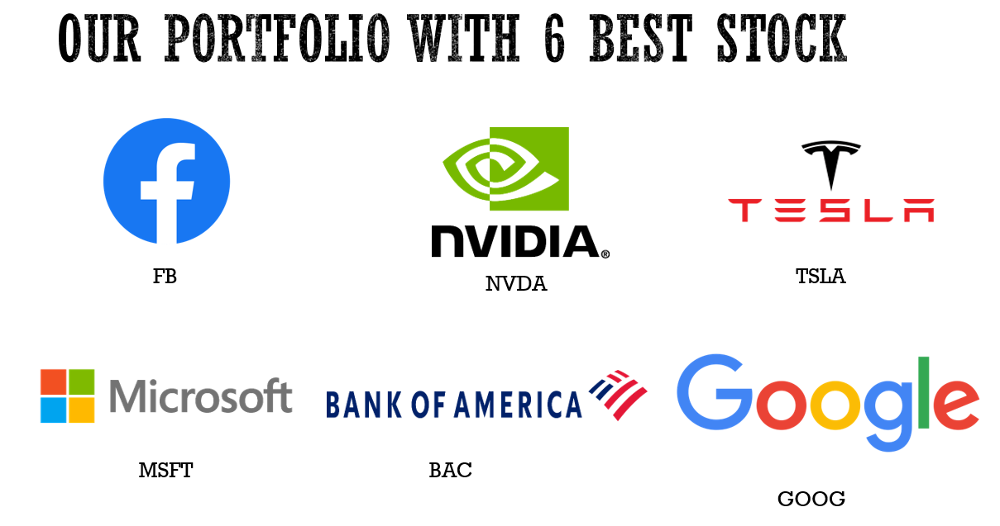

In [11]:
watch_df_list=watch_df[watch_list_26_10]
watch_df_list

,FB,GOOG,TSLA,MSFT,BAC,NVDA
Date,,,,,,
2018-10-25,150.949997,1095.569946,62.972000,108.300003,26.590000,51.959999
2018-10-26,145.369995,1071.469971,66.180000,106.959999,26.389999,49.572498
2018-10-29,142.089996,1020.080017,66.970001,103.849998,26.610001,46.404999
2018-10-30,146.220001,1036.209961,65.980003,103.730003,26.780001,50.750000
2018-10-31,151.789993,1076.770020,67.463997,106.809998,27.500000,52.707500
...,...,...,...,...,...,...
2021-10-20,340.779999,2848.300049,865.799988,307.410004,47.090000,221.029999
2021-10-21,341.880005,2855.610107,894.000000,310.760010,46.830002,226.919998
2021-10-22,324.609985,2772.500000,909.679993,309.160004,47.570000,227.259995


### Our 6 stock rate od returns

In [12]:
watch_df_list_change = watch_df_list.pct_change()
watch_df_list_change

,FB,GOOG,TSLA,MSFT,BAC,NVDA
Date,,,,,,
2018-10-25,NaN,NaN,NaN,NaN,NaN,NaN
2018-10-26,-0.036966,-0.021998,0.050943,-0.012373,-0.007522,-0.045949
2018-10-29,-0.022563,-0.047962,0.011937,-0.029076,0.008337,-0.063896
2018-10-30,0.029066,0.015812,-0.014783,-0.001155,0.006389,0.093632
2018-10-31,0.038093,0.039143,0.022492,0.029692,0.026886,0.038571
...,...,...,...,...,...,...
2021-10-20,0.002324,-0.009783,0.001770,-0.002660,0.013124,-0.008389
2021-10-21,0.003228,0.002566,0.032571,0.010898,-0.005521,0.026648
2021-10-22,-0.050515,-0.029104,0.017539,-0.005149,0.015802,0.001498


### Generating 15000 portfolios with out 6 stocks

In [13]:
all_portfolios=pd.DataFrame(columns=['portfolio_return',
                                     'portfolio_st_dev',
                                     'weight of '+ watch_df_list.columns[0],
                                     'weight of '+ watch_df_list.columns[1],
                                     'weight of '+ watch_df_list.columns[2],
                                     'weight of '+ watch_df_list.columns[3],
                                     'weight of '+ watch_df_list.columns[4],
                                     'weight of '+ watch_df_list.columns[5]])

number_assets = len(watch_df_list.columns)

number_porfolios = 15000

for porfolios in range(number_porfolios):
    weight = np.random.random(number_assets)
    weight = weight / weight.sum()
    
    porfolio_return=(watch_df_list_change[1:]*weight).sum(1).mean()
    
    portfolio_var=np.dot(np.dot(weight.T,watch_df_list_change.cov()),
                                weight)
    portfolio_st_dev = np.sqrt(portfolio_var)
    
    all_portfolios =all_portfolios.append({'portfolio_return':porfolio_return,
                                           'portfolio_st_dev':portfolio_st_dev,
                                           'weight of '+ watch_df_list.columns[0]:weight[0],
                                          'weight of '+ watch_df_list.columns[1]:weight[1],
                                          'weight of '+ watch_df_list.columns[2]:weight[2],
                                          'weight of '+ watch_df_list.columns[3]:weight[3],
                                          'weight of '+ watch_df_list.columns[4]:weight[4],
                                          'weight of '+ watch_df_list.columns[5]:weight[5]},
                            ignore_index=True) #append row for every car

### All possible porfolios with our stocks

In [14]:
fig = go.Figure() # create figure
fig.add_trace(go.Scatter(x=all_portfolios.portfolio_st_dev,
                         y=all_portfolios.portfolio_return,mode='markers') )
        
fig.update_layout(
                dict(title_text="All possible porfolios with our stocks",
                     autosize=True,
                     yaxis_title='Rate of returns',
                     xaxis_title='Standard deviation')
                    )
fig.show()

In [15]:
all_portfolios['Sharpe_ratio']=all_portfolios['portfolio_return']/all_portfolios['portfolio_st_dev']
best_sharpe=all_portfolios.iloc[all_portfolios['Sharpe_ratio'].argmax(),:] # portfolio with maximum Sharpe ratio

best_return = all_portfolios.iloc[all_portfolios['portfolio_return'].argmax(),:] # portfolio with maximum rate of return

best_sd = all_portfolios.iloc[all_portfolios['portfolio_st_dev'].argmin(),:] # porfolio with minimum st dev

### Our stocks and best portfolios in all possible portfolios

In [16]:
fig = go.Figure() # create figure
fig.add_trace(go.Scatter(x=all_portfolios.portfolio_st_dev,
                         y=all_portfolios.portfolio_return,mode='markers',showlegend=False) )

fig.add_trace(go.Scatter(x=np.array(best_sharpe[1]),
                         y=np.array(best_sharpe[0]),name='Best from Sharpe',
                         marker=dict(size=[15])) )

fig.add_trace(go.Scatter(x=np.array(best_return[1]),
                         y=np.array(best_return[0]),name='Best from Return',
                        marker=dict(size=[15])) )

fig.add_trace(go.Scatter(x=np.array(best_sd[1]),
                         y=np.array(best_sd[0]),name='Best from SD',
                        marker=dict(size=[15]) ))

for i in watch_df_list_change.columns:
    fig.add_trace(go.Scatter(x=np.array(np.std(watch_df_list_change[i])),
                             y=np.array(np.mean(watch_df_list_change[i])),
                             text=i,
                             name=i,
                             marker=dict(size=[20]) ))
fig.update_traces(textposition="bottom right")      
fig.update_layout(
                dict(title_text="All possible porfolios with our stocks",
                     autosize=True,
                     yaxis_title='Rate of returns',
                     xaxis_title='Standard deviation')
                    )
fig.show()

### The weights of our stocks from best Sharpe ratio portfolio

In [17]:
weight_list=watch_df_list[-100:].pct_change().median()/sum(watch_df_list[-100:].pct_change().median())

for i in range(len(best_sharpe[2:-1])):
    weight_list[i]=best_sharpe[2:-1][i]
weight_list

FB      0.003712
GOOG    0.244623
TSLA    0.447205
MSFT    0.049061
BAC     0.001242
NVDA    0.254157
dtype: float64

### Portfolio rate of return

In [18]:
watch_df_list_change['porfolio return']=(watch_df_list_change*weight_list.values).sum(1).values
watch_df_list_change

,FB,GOOG,TSLA,MSFT,BAC,NVDA,porfolio return
Date,,,,,,,
2018-10-25,NaN,NaN,NaN,NaN,NaN,NaN,0.000000
2018-10-26,-0.036966,-0.021998,0.050943,-0.012373,-0.007522,-0.045949,0.004969
2018-10-29,-0.022563,-0.047962,0.011937,-0.029076,0.008337,-0.063896,-0.024134
2018-10-30,0.029066,0.015812,-0.014783,-0.001155,0.006389,0.093632,0.021114
2018-10-31,0.038093,0.039143,0.022492,0.029692,0.026886,0.038571,0.031068
...,...,...,...,...,...,...,...
2021-10-20,0.002324,-0.009783,0.001770,-0.002660,0.013124,-0.008389,-0.003839
2021-10-21,0.003228,0.002566,0.032571,0.010898,-0.005521,0.026648,0.022506
2021-10-22,-0.050515,-0.029104,0.017539,-0.005149,0.015802,0.001498,0.000684


### Historical rate of return of our portfolio

In [19]:
fig = go.Figure() # create figure
fig.add_trace(go.Scatter(x=watch_df_list_change.index[1:],
                         y=watch_df_list_change['porfolio return'] ) )
        
fig.update_layout(
                dict(title_text="Portfolio rate of return (from 2020/10/25 - 2021/10/26)",
                     autosize=True,
                     yaxis_title='rate of return')
                    )
fig.show()

### Mean price of our portfolio

In [20]:
watch_df_list['porfolio mean price']=(watch_df_list*weight_list.values).sum(1).values
watch_df_list

,FB,GOOG,TSLA,MSFT,BAC,NVDA,porfolio mean price
Date,,,,,,,
2018-10-25,150.949997,1095.569946,62.972000,108.300003,26.590000,51.959999,315.275826
2018-10-26,145.369995,1071.469971,66.180000,106.959999,26.389999,49.572498,310.121544
2018-10-29,142.089996,1020.080017,66.970001,103.849998,26.610001,46.404999,296.934142
2018-10-30,146.220001,1036.209961,65.980003,103.730003,26.780001,50.750000,301.551134
2018-10-31,151.789993,1076.770020,67.463997,106.809998,27.500000,52.707500,312.806903
...,...,...,...,...,...,...,...
2021-10-20,340.779999,2848.300049,865.799988,307.410004,47.090000,221.029999,1156.531870
2021-10-21,341.880005,2855.610107,894.000000,310.760010,46.830002,226.919998,1172.596366
2021-10-22,324.609985,2772.500000,909.679993,309.160004,47.570000,227.259995,1159.222606


### Historical mean price of our Portfolio

In [21]:
fig = go.Figure() # create figure
fig.add_trace(go.Scatter(x=watch_df_list.index[1:],
                         y=watch_df_list['porfolio mean price'] ) )
        
fig.update_layout(
                dict(title_text="Portfolio mean price (from 2020/10/25 - 2021/10/26)",
                     autosize=True,
                     yaxis_title='Mean price')
                    )
fig.show()

### Description of stocks in our portfolio in 26/10/2021

In [22]:
count_stock={}
for i in watch_list_26_10:
    count_stock[i] = 100000*weight_list[i]/watch_df_list[i][-1]

for i in watch_list_26_10:
    print("Price of {} in 26/10/2021 is ----> {}".format(i,round(watch_df_list[i][-1],3)))
    print("Weight of {} in our portfolio is ----> {}".format(i,round(weight_list[i],4)))
    print("Overall value of {} in our portfolio is ----> {}".format(i,round(100000*weight_list[i],3)))
    print("Count of {} stock is ----> {}".format(i,round(count_stock[i],3)))
    print('\n##################################################\n')

Price of FB in 26/10/2021 is ----> 315.81
Weight of FB in our portfolio is ----> 0.0037
Overall value of FB in our portfolio is ----> 371.234
Count of FB stock is ----> 1.175

##################################################

Price of GOOG in 26/10/2021 is ----> 2793.44
Weight of GOOG in our portfolio is ----> 0.2446
Overall value of GOOG in our portfolio is ----> 24462.312
Count of GOOG stock is ----> 8.757

##################################################

Price of TSLA in 26/10/2021 is ----> 1018.43
Weight of TSLA in our portfolio is ----> 0.4472
Overall value of TSLA in our portfolio is ----> 44720.507
Count of TSLA stock is ----> 43.911

##################################################

Price of MSFT in 26/10/2021 is ----> 310.11
Weight of MSFT in our portfolio is ----> 0.0491
Overall value of MSFT in our portfolio is ----> 4906.111
Count of MSFT stock is ----> 15.821

##################################################

Price of BAC in 26/10/2021 is ----> 47.96
Weight of BAC

# Rebalance 03/11/2021

In [23]:
watch_list_26_10

['FB', 'GOOG', 'TSLA', 'MSFT', 'BAC', 'NVDA']

### Our 6 stocks prices during 26/10/2021 - 03/11/2021

In [24]:
watch_df_26_10__03_11 = yf.download(watch_list,
                                    start='2021-10-27',
                                    end='2021-11-04',
                                    progress=False,
                                   )
watch_df_26_10__03_11 = watch_df_26_10__03_11['Close']

### Our portfolio value during 26/10/2021 - 03/11/2021

In [25]:
watch_list_2=watch_df_26_10__03_11[watch_list_26_10]
watch_list_2['Portfolio']=(watch_list_2*count_stock.values()).sum(1)
watch_list_2['Portfolio'][0]=100000
watch_list_2

,FB,GOOG,TSLA,MSFT,BAC,NVDA,Portfolio
Date,,,,,,,
2021-10-26,315.809998,2793.439941,1018.429993,310.109985,47.959999,247.169998,100000.000000
2021-10-27,312.220001,2928.550049,1037.859985,323.170013,47.040001,244.509995,101962.857259
2021-10-28,316.920013,2922.580078,1077.040039,324.350006,47.779999,249.410004,104160.982451
2021-10-29,323.570007,2965.409912,1114.000000,331.619995,47.779999,255.669998,106925.529539
2021-11-01,329.980011,2875.479980,1208.589966,329.369995,47.849998,258.269989,110531.037515
2021-11-02,328.079987,2917.260010,1172.000000,333.130005,47.880001,264.010010,109937.754285
2021-11-03,331.619995,2935.800049,1213.859985,334.000000,48.369999,265.980011,112159.995974


In [26]:
create_line_chart(index_chart = watch_list_2.index,
                  values_chart = watch_list_2['Portfolio'],
                  end_time = '2021/11/03')

In [27]:
create_all_line_chart(watch_list = watch_list_26_10,
                      data = watch_list_2,
                      start_time = '2021/10/26',
                      end_time = '2021/11/03')

### Rate of return during 2021/10/26 - 2021/11/03

In [28]:
create_all_line_chart(watch_list = watch_list_26_10,
                      data = watch_list_2.pct_change(),
                      start_time = '2021/10/26',
                      end_time = '2021/11/03')

In [29]:
growth_during_week(data_stock = watch_list_2)

### Description of stocks in our portfolio in 03/11/2021

In [30]:
for i in watch_list_26_10:
    print("Price of {} in 03/11/2021 is ----> {}".format(i,
          round(watch_list_2[i][-1], 3)))
    weight_i = count_stock[i] * watch_list_2[i][-1] / watch_list_2.iloc[-1, -1]
    print("Weight of {} in our portfolio is ----> {}".format(i, round(weight_i,4)))
    print("Overall value of {} in our portfolio is ----> {}".format(i,
          round(watch_list_2[i][-1]*count_stock[i], 3)))
    print("Count of {} stock is ----> {}".format(i, round(count_stock[i],3)))
    print('\n##################################################\n')

Price of FB in 03/11/2021 is ----> 331.62
Weight of FB in our portfolio is ----> 0.0035
Overall value of FB in our portfolio is ----> 389.819
Count of FB stock is ----> 1.175

##################################################

Price of GOOG in 03/11/2021 is ----> 2935.8
Weight of GOOG in our portfolio is ----> 0.2292
Overall value of GOOG in our portfolio is ----> 25708.967
Count of GOOG stock is ----> 8.757

##################################################

Price of TSLA in 03/11/2021 is ----> 1213.86
Weight of TSLA in our portfolio is ----> 0.4752
Overall value of TSLA in our portfolio is ----> 53302.077
Count of TSLA stock is ----> 43.911

##################################################

Price of MSFT in 03/11/2021 is ----> 334.0
Weight of MSFT in our portfolio is ----> 0.0471
Overall value of MSFT in our portfolio is ----> 5284.065
Count of MSFT stock is ----> 15.821

##################################################

Price of BAC in 03/11/2021 is ----> 48.37
Weight of BAC i

### Dynamics of other stosk during 26/10/2021 - 03/11/2021

In [31]:
watch_list_others = ["AMZN", "C", "AAPL", "IBM", "CSCO",
              "TM", "CVX", "JPM", "JNJ",
              "RLLCF", "WMT", "MA", "V", "DIS", "PG"]


watch_df_others = yf.download(watch_list_others,
                       start='2021-10-27',
                       end='2021-11-04',
                       progress=False,
                       )
watch_df_others  = watch_df_others ['Close']

In [32]:
fig = go.Figure() # create figure
for i in watch_list_others:
    fig.add_trace(go.Scatter(x=watch_df_others.index, y=watch_df_others.pct_change()[i], name = i) )
        
fig.update_layout(
    dict(title_text="Rate of returns (from 2021/10/26 - 2021/11/03)",
         autosize=True,
         yaxis_title='rate of return')
                    )
fig.show()

In [33]:
fig = go.Figure() # create figure
for i in watch_list_others:
    fig.add_trace(go.Scatter(x=watch_df_others.index, y=watch_df_others[i], name = i) )
        
fig.update_layout(
    dict(title_text="STOCK DATA (from 2021/10/26 - 2021/11/03)",
         autosize=True,
         yaxis_title='Close price')
                    )
fig.show()

### Rate of return of other stocks for 1 week

In [34]:
100*(watch_df_others.iloc[-1, :]-watch_df_others.iloc[0, :]) / watch_df_others.iloc[0, :]

AAPL      1.453253
AMZN      0.234886
C        -2.335459
CSCO      3.296900
CVX      -0.955299
DIS      -1.139265
IBM       0.000000
JNJ      -0.416291
JPM      -0.507582
MA       -7.805332
PG        1.540075
RLLCF    -9.574462
TM        4.543886
V       -10.232077
WMT       0.961340
dtype: float64

### Our new rebalanced portfolio in 03/11/2011

In [35]:
new_03_11_2021_list = ['FB', 'GOOG', 'TSLA', 'MSFT','NVDA', 'TM' ]

watch_df_03_11 = yf.download(new_03_11_2021_list,
                                    start='2021-11-04',
                                    end='2021-11-04',
                                    progress=False,
                                   )
watch_df_03_11 = watch_df_03_11['Close']

watch_df_03_11

,FB,GOOG,MSFT,NVDA,TM,TSLA
Date,,,,,,
2021-11-03,331.619995,2935.800049,334.0,265.980011,181.070007,1213.859985


In [36]:
count_TM = (watch_list_2.iloc[-1, -1]*count_stock['BAC'] * watch_list_2['BAC'][-1] / watch_list_2.iloc[-1, -1]) / watch_df_others['TM'][-1]
count_stock["TM"] = count_stock.pop("BAC")
count_stock['TM'] = count_TM

In [37]:
for i in new_03_11_2021_list:
    print("Price of {} in 03/11/2021 is ----> {}".format(i,
          round(watch_df_03_11[i][-1], 3)))
    weight_i = count_stock[i] * watch_df_03_11[i][-1] / watch_list_2.iloc[-1, -1]
    print("Weight of {} in our portfolio is ----> {}".format(i, round(weight_i,4)))
    print("Overall value of {} in our portfolio is ----> {}".format(i,
          round(watch_df_03_11[i][-1]*count_stock[i], 3)))
    print("Count of {} stock is ----> {}".format(i, round(count_stock[i],3)))
    print('\n##################################################\n')

Price of FB in 03/11/2021 is ----> 331.62
Weight of FB in our portfolio is ----> 0.0035
Overall value of FB in our portfolio is ----> 389.819
Count of FB stock is ----> 1.175

##################################################

Price of GOOG in 03/11/2021 is ----> 2935.8
Weight of GOOG in our portfolio is ----> 0.2292
Overall value of GOOG in our portfolio is ----> 25708.967
Count of GOOG stock is ----> 8.757

##################################################

Price of TSLA in 03/11/2021 is ----> 1213.86
Weight of TSLA in our portfolio is ----> 0.4752
Overall value of TSLA in our portfolio is ----> 53302.077
Count of TSLA stock is ----> 43.911

##################################################

Price of MSFT in 03/11/2021 is ----> 334.0
Weight of MSFT in our portfolio is ----> 0.0471
Overall value of MSFT in our portfolio is ----> 5284.065
Count of MSFT stock is ----> 15.821

##################################################

Price of NVDA in 03/11/2021 is ----> 265.98
Weight of NVD

# Rebalance 10/11/2021

### Stock prices during 03/11/2021 - 10/11/2021

In [38]:
data_03_10=portfolio_df(start_time='2021-11-04',
                         end_time='2021-11-11',
                         stock_list=['FB', 'GOOG', 'TSLA', 'MSFT', 'NVDA', 'TM'],
                         count_stock=count_stock)

data_03_10

,FB,GOOG,TSLA,MSFT,NVDA,TM,Portfolio
Date,,,,,,,
2021-11-03,331.619995,2935.800049,1213.859985,334.000000,265.980011,181.070007,112159.995974
2021-11-04,335.850006,2973.659912,1229.910034,336.440002,298.010010,181.479996,116533.710482
2021-11-05,341.130005,2984.820068,1222.089966,336.059998,297.519989,179.279999,116236.337841
2021-11-08,338.619995,2987.030029,1162.939941,336.989990,308.040009,180.479996,114752.671645
2021-11-09,335.369995,2984.969971,1023.500000,335.950012,306.570007,176.320007,108437.347347
2021-11-10,327.640015,2932.520020,1067.949951,330.799988,294.589996,177.360001,108608.183705


In [39]:
portfolio_values = watch_list_2['Portfolio']
portfolio_values=portfolio_values.append(data_03_10['Portfolio'][1:])

### Portfolio values during 26/10/2021 to 11/11/2021

In [40]:
create_line_chart(index_chart = portfolio_values.index,
                  values_chart = portfolio_values.values,
                  end_time = '11/11/2021')

In [41]:
create_all_line_chart(watch_list = ['FB', 'GOOG', 'TSLA', 'MSFT', 'NVDA', 'TM'],
                      data = data_03_10,
                      start_time = '03/11/2021',
                      end_time = '10/11/2021')

### Rate of return of stocks

In [42]:
create_all_line_chart(watch_list = ['FB', 'GOOG', 'TSLA', 'MSFT', 'NVDA', 'TM'],
                      data = data_03_10.pct_change(),
                      start_time = '03/11/2021',
                      end_time = '10/11/2021')

### Rate of return of our stocks

In [43]:
growth_during_week(data_stock = data_03_10)

### Description of stocks in our portfolio in 10/11/2021

In [44]:
description_portfolio(watch_list = ['FB', 'GOOG', 'TSLA', 'MSFT', 'NVDA', 'TM'],
                      data_portfolio = data_03_10,
                      count_stock = count_stock)

Price of FB in 2021-11-10 is ----> 327.64
Weight of FB in our portfolio is ----> 0.0035
Overall value of FB in our portfolio is ----> 385.14
Count of FB stock is ----> 1.175

##################################################

Price of GOOG in 2021-11-10 is ----> 2932.52
Weight of GOOG in our portfolio is ----> 0.2364
Overall value of GOOG in our portfolio is ----> 25680.244
Count of GOOG stock is ----> 8.757

##################################################

Price of TSLA in 2021-11-10 is ----> 1067.95
Weight of TSLA in our portfolio is ----> 0.4318
Overall value of TSLA in our portfolio is ----> 46894.989
Count of TSLA stock is ----> 43.911

##################################################

Price of MSFT in 2021-11-10 is ----> 330.8
Weight of MSFT in our portfolio is ----> 0.0482
Overall value of MSFT in our portfolio is ----> 5233.439
Count of MSFT stock is ----> 15.821

##################################################

Price of NVDA in 2021-11-10 is ----> 294.59
Weight of NVD

### Prices of other stocks

In [45]:
watch_list_others = ["AMZN", "C", "AAPL", "IBM", "CSCO",
              "BAC", "CVX", "JPM", "JNJ",
              "RLLCF", "WMT", "MA", "V", "DIS", "PG"]


watch_df_others = yf.download(watch_list_others,
                       start='2021-11-04',
                       end='2021-11-11',
                       progress=False,
                       )
watch_df_others  = watch_df_others ['Close']

create_all_line_chart(watch_list = watch_list_others,
                      data = watch_df_others,
                      start_time = '03/11/2021',
                      end_time = '10/11/2021')

### Change structures of our portfolio

### Selling $30000 from `TSLA`

In [46]:
count_stock['TSLA']-= (30000/data_03_10['TSLA'][-1])

### Buying $15000 `NVDA`

In [47]:
count_stock['NVDA'] += (15000/data_03_10['NVDA'][-1])

In [48]:
count_stock

{'FB': 1.1754982536031042,
 'GOOG': 8.757056585932718,
 'TSLA': 15.820019554826416,
 'MSFT': 15.820552884763933,
 'NVDA': 153.74489711577996,
 'TM': 0.6916057658915029}

In [49]:
df_11_11 = yf.download(['FB','GOOG','TSLA','MSFT','NVDA','TM','AMZN','MA'],
            start='2021-11-11',
            end='2021-11-11',
            progress=False)

df_11_11 = df_11_11['Close']
    
df_11_11 = df_11_11.reindex(columns=['FB','GOOG','TSLA','MSFT','NVDA','TM','AMZN','MA'])

In [50]:
df_11_11

,FB,GOOG,TSLA,MSFT,NVDA,TM,AMZN,MA
Date,,,,,,,,
2021-11-10,327.640015,2932.52002,1067.949951,330.799988,294.589996,177.360001,3482.050049,357.940002


### Buying $10000 `AMZN`

### Buying $5000 `MA`

In [51]:
count_stock['AMZN'] = (10000/df_11_11['AMZN'][-1])
count_stock['MA'] = (5000/df_11_11['MA'][-1])

In [52]:
count_stock

{'FB': 1.1754982536031042,
 'GOOG': 8.757056585932718,
 'TSLA': 15.820019554826416,
 'MSFT': 15.820552884763933,
 'NVDA': 153.74489711577996,
 'TM': 0.6916057658915029,
 'AMZN': 2.871871414761966,
 'MA': 13.968821494933318}

### Our portfolio in 10/11/2021

In [53]:
df_11_11= portfolio_df(start_time='2021-11-11',
                         end_time='2021-11-11',
                         stock_list=['FB','GOOG','TSLA','MSFT','NVDA','TM','AMZN','MA'],
                       count_stock=count_stock)

df_11_11

,FB,GOOG,TSLA,MSFT,NVDA,TM,AMZN,MA,Portfolio
Date,,,,,,,,,
2021-11-10,327.640015,2932.52002,1067.949951,330.799988,294.589996,177.360001,3482.050049,357.940002,108608.183705


### Final description of stocks in our portfolio in 10/11/2021

In [54]:
description_portfolio(watch_list = ['FB','GOOG','TSLA','MSFT','NVDA','TM','AMZN','MA'],
                      data_portfolio = df_11_11,
                      count_stock = count_stock)

Price of FB in 2021-11-10 is ----> 327.64
Weight of FB in our portfolio is ----> 0.0035
Overall value of FB in our portfolio is ----> 385.14
Count of FB stock is ----> 1.175

##################################################

Price of GOOG in 2021-11-10 is ----> 2932.52
Weight of GOOG in our portfolio is ----> 0.2364
Overall value of GOOG in our portfolio is ----> 25680.244
Count of GOOG stock is ----> 8.757

##################################################

Price of TSLA in 2021-11-10 is ----> 1067.95
Weight of TSLA in our portfolio is ----> 0.1556
Overall value of TSLA in our portfolio is ----> 16894.989
Count of TSLA stock is ----> 15.82

##################################################

Price of MSFT in 2021-11-10 is ----> 330.8
Weight of MSFT in our portfolio is ----> 0.0482
Overall value of MSFT in our portfolio is ----> 5233.439
Count of MSFT stock is ----> 15.821

##################################################

Price of NVDA in 2021-11-10 is ----> 294.59
Weight of NVDA

## Rebalance 17/11/2021

### Stock prices during 10/11/2021 - 1711/2021

In [55]:
data_10_17=portfolio_df(start_time='2021-11-11',
                         end_time='2021-11-18',
                         stock_list=['FB','GOOG','TSLA','MSFT','NVDA','TM','AMZN','MA'],
                         count_stock=count_stock)

data_10_17

,FB,GOOG,TSLA,MSFT,NVDA,TM,AMZN,MA,Portfolio
Date,,,,,,,,,
2021-11-10,327.640015,2932.520020,1067.949951,330.799988,294.589996,177.360001,3482.050049,357.940002,108608.183705
2021-11-11,327.739990,2934.959961,1063.510010,332.429993,303.899994,179.029999,3472.500000,354.339996,109940.020792
2021-11-12,340.890015,2992.909912,1033.420044,336.720001,303.899994,184.399994,3525.149902,363.500000,110337.668209
2021-11-15,347.559998,2987.760010,1013.390015,336.070007,300.250000,184.389999,3545.679932,361.359985,109441.143331
2021-11-16,342.959991,2981.520020,1054.729980,339.510010,302.029999,187.429993,3540.699951,369.559998,110465.524742
2021-11-17,340.769989,2981.239990,1089.010010,339.119995,292.609985,186.210007,3549.000000,359.170013,109426.216747


In [56]:
portfolio_values=portfolio_values.append(data_10_17['Portfolio'][1:])

### Portfolio values during 10/11/2021 - 17/11/2021

In [57]:
create_line_chart(index_chart = portfolio_values.index,
                  values_chart = portfolio_values.values,
                  end_time = '11/17/2021')

### Our stok proces

In [58]:
create_all_line_chart(watch_list = ['FB','GOOG','TSLA','MSFT','NVDA','TM','AMZN','MA'],
                      data = data_10_17,
                      start_time = '10/11/2021',
                      end_time = '17/11/2021')

### Our stock rate of return

In [59]:
create_all_line_chart(watch_list = ['FB','GOOG','TSLA','MSFT','NVDA','TM','AMZN','MA'],
                      data = data_10_17.pct_change(),
                      start_time = '10/11/2021',
                      end_time = '17/11/2021')

### Our portfolio rate of return during last week

In [60]:
growth_during_week(data_stock = data_10_17)

### Portfolio description

In [61]:
description_portfolio(watch_list = ['FB','GOOG','TSLA','MSFT','NVDA','TM','AMZN','MA'],
                      data_portfolio = data_10_17,
                      count_stock = count_stock)

Price of FB in 2021-11-17 is ----> 340.77
Weight of FB in our portfolio is ----> 0.0037
Overall value of FB in our portfolio is ----> 400.575
Count of FB stock is ----> 1.175

##################################################

Price of GOOG in 2021-11-17 is ----> 2981.24
Weight of GOOG in our portfolio is ----> 0.2386
Overall value of GOOG in our portfolio is ----> 26106.887
Count of GOOG stock is ----> 8.757

##################################################

Price of TSLA in 2021-11-17 is ----> 1089.01
Weight of TSLA in our portfolio is ----> 0.1574
Overall value of TSLA in our portfolio is ----> 17228.16
Count of TSLA stock is ----> 15.82

##################################################

Price of MSFT in 2021-11-17 is ----> 339.12
Weight of MSFT in our portfolio is ----> 0.049
Overall value of MSFT in our portfolio is ----> 5365.066
Count of MSFT stock is ----> 15.821

##################################################

Price of NVDA in 2021-11-17 is ----> 292.61
Weight of NVDA

### Other stok prices

In [62]:
create_others_price(all_watch_list = watch_list,
                    portfolio_list = ['FB','GOOG','TSLA','MSFT','NVDA','TM','AMZN','MA'],
                    start_time = '2021-11-11',
                    end_time = '2021-11-17')

### We achieved some results from `GARCH model`, but this is not good enough

In [63]:
from arch import arch_model
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from datetime import datetime, timedelta
returns = watch_df_others = yf.download(watch_list,
                                           start='2021-01-01',
                                           end='2021-11-17',
                                           progress=False,
                                           )['Close'].pct_change()
mean_forecast ={}
for i in range(len(returns.columns)):
    train = returns.iloc[1:,i]
    model = arch_model(train, p=3, q=3)
    model_fit = model.fit(disp='off')
    pred = model_fit.forecast(horizon=7)
    future_dates = [returns.index[-1] + timedelta(days=i) for i in range(1,8)]
    pred = pd.Series(np.sqrt(pred.variance.values[-1,:]), index=future_dates)
    mean_forecast[returns.columns[i]] = round(pred.max(),3)

mean_forecast = dict( sorted(mean_forecast.items(),
                             key=lambda item: item[1],
                             reverse=True))
mean_forecast

{'RLLCF': 0.618,
 'TSLA': 0.05,
 'NVDA': 0.035,
 'DIS': 0.024,
 'FB': 0.019,
 'TM': 0.019,
 'V': 0.019,
 'MA': 0.018,
 'BAC': 0.016,
 'CVX': 0.016,
 'AMZN': 0.015,
 'C': 0.015,
 'IBM': 0.015,
 'GOOG': 0.014,
 'JPM': 0.013,
 'AAPL': 0.012,
 'MSFT': 0.012,
 'CSCO': 0.011,
 'JNJ': 0.009,
 'WMT': 0.009,
 'PG': 0.008}

### Sell all `MA` stock

In [64]:
# overall MA value
MA_value = count_stock['MA'] * data_10_17['MA'][-1]

del count_stock['MA']

### By that money we bought `TSLA`

In [65]:
count_stock['TSLA'] += MA_value / data_10_17['TSLA'][-1]

### Our stockscounts

In [66]:
count_stock

{'FB': 1.1754982536031042,
 'GOOG': 8.757056585932718,
 'TSLA': 20.427123033135686,
 'MSFT': 15.820552884763933,
 'NVDA': 153.74489711577996,
 'TM': 0.6916057658915029,
 'AMZN': 2.871871414761966}

### Our portfolio in 17/11/2021

In [67]:
df_17_17= portfolio_df(start_time='2021-11-18',
                         end_time='2021-11-18',
                         stock_list=['FB','GOOG','TSLA','MSFT','NVDA','TM','AMZN'],
                       count_stock=count_stock)

df_17_17

,FB,GOOG,TSLA,MSFT,NVDA,TM,AMZN,Portfolio
Date,,,,,,,,
2021-11-17,340.769989,2981.23999,1089.01001,339.119995,292.609985,186.210007,3549.0,109426.216747


### Description of our portfolio in 17/11/2021 after rebalance

In [68]:
description_portfolio(watch_list = ['FB','GOOG','TSLA','MSFT','NVDA','TM','AMZN'],
                      data_portfolio = df_17_17,
                      count_stock = count_stock)

Price of FB in 2021-11-17 is ----> 340.77
Weight of FB in our portfolio is ----> 0.0037
Overall value of FB in our portfolio is ----> 400.575
Count of FB stock is ----> 1.175

##################################################

Price of GOOG in 2021-11-17 is ----> 2981.24
Weight of GOOG in our portfolio is ----> 0.2386
Overall value of GOOG in our portfolio is ----> 26106.887
Count of GOOG stock is ----> 8.757

##################################################

Price of TSLA in 2021-11-17 is ----> 1089.01
Weight of TSLA in our portfolio is ----> 0.2033
Overall value of TSLA in our portfolio is ----> 22245.341
Count of TSLA stock is ----> 20.427

##################################################

Price of MSFT in 2021-11-17 is ----> 339.12
Weight of MSFT in our portfolio is ----> 0.049
Overall value of MSFT in our portfolio is ----> 5365.066
Count of MSFT stock is ----> 15.821

##################################################

Price of NVDA in 2021-11-17 is ----> 292.61
Weight of NV

## Rebalance 24/11/2021

###  Stock prices during 10/11/2021 - 17/11/2021

In [69]:
data_17_24 = portfolio_df(start_time='2021-11-18',
                          end_time='2021-11-25',
                          stock_list=['FB', 'GOOG', 'TSLA','MSFT', 'NVDA', 'TM', 'AMZN'],
                          count_stock=count_stock)


data_17_24

,FB,GOOG,TSLA,MSFT,NVDA,TM,AMZN,Portfolio
Date,,,,,,,,
2021-11-17,340.769989,2981.239990,1089.010010,339.119995,292.609985,186.210007,3549.000000,109426.216747
2021-11-18,338.690002,3014.179932,1096.380005,341.269989,316.750000,184.649994,3696.060059,114029.453279
2021-11-19,345.299988,2999.050049,1137.060059,343.109985,329.850006,185.960007,3676.570068,116723.808644
2021-11-22,341.010010,2941.570068,1156.869995,339.829987,319.559998,185.089996,3572.570068,114686.866321
2021-11-23,337.250000,2935.139893,1109.030029,337.679993,317.459991,185.059998,3580.040039,113313.456889
2021-11-24,341.059998,2934.350098,1116.000000,337.910004,326.739990,184.809998,3580.409912,114884.676390


In [70]:
portfolio_values=portfolio_values.append(data_17_24['Portfolio'][1:])

### Portfolio values during all time

In [71]:
create_line_chart(index_chart = portfolio_values.index,
                  values_chart = portfolio_values.values,
                  end_time = '24/11/2021')

### Portdolio description before rebalance in 24/11/2021

In [72]:
description_portfolio(watch_list = ['FB', 'GOOG', 'TSLA','MSFT', 'NVDA', 'TM', 'AMZN'],
                      data_portfolio = data_17_24,
                      count_stock = count_stock)

Price of FB in 2021-11-24 is ----> 341.06
Weight of FB in our portfolio is ----> 0.0035
Overall value of FB in our portfolio is ----> 400.915
Count of FB stock is ----> 1.175

##################################################

Price of GOOG in 2021-11-24 is ----> 2934.35
Weight of GOOG in our portfolio is ----> 0.2237
Overall value of GOOG in our portfolio is ----> 25696.27
Count of GOOG stock is ----> 8.757

##################################################

Price of TSLA in 2021-11-24 is ----> 1116.0
Weight of TSLA in our portfolio is ----> 0.1984
Overall value of TSLA in our portfolio is ----> 22796.669
Count of TSLA stock is ----> 20.427

##################################################

Price of MSFT in 2021-11-24 is ----> 337.91
Weight of MSFT in our portfolio is ----> 0.0465
Overall value of MSFT in our portfolio is ----> 5345.923
Count of MSFT stock is ----> 15.821

##################################################

Price of NVDA in 2021-11-24 is ----> 326.74
Weight of NVD

### Our stok proces

In [73]:
create_all_line_chart(watch_list = ['FB', 'GOOG', 'TSLA','MSFT', 'NVDA', 'TM', 'AMZN'],
                      data = data_17_24,
                      start_time = '17/11/2021',
                      end_time = '24/11/2021')

### Our stock rate of return

In [74]:
create_all_line_chart(watch_list = ['FB', 'GOOG', 'TSLA','MSFT', 'NVDA', 'TM', 'AMZN'],
                      data = data_17_24.pct_change(),
                      start_time = '17/11/2021',
                      end_time = '24/11/2021')

### Our portfolio rate of return during last week

In [75]:
growth_during_week(data_stock = data_17_24)

### Other stok prices

In [76]:
create_others_price(all_watch_list = watch_list,
                    portfolio_list = ['FB', 'GOOG', 'TSLA','MSFT', 'NVDA', 'TM', 'AMZN'],
                    start_time = '2021-10-01',
                    end_time = '2021-11-25')

### Sell all `GOOG` stock

In [77]:
# overall GOOG value
GOOG_value = count_stock['GOOG'] * data_17_24['GOOG'][-1]
del count_stock['GOOG']

### Sell all `AMZN` stock

In [78]:
# overall AMZN value
AMZN_value = count_stock['AMZN'] * data_17_24['AMZN'][-1]
del count_stock['AMZN']

### Buy `AAPL` stock with `$12000`
### Buy `WMT` stock with `$6000`
### Buy `CSCO` stock with `$6000`
### Buy `V` stock with `$6000`
### Buy `PG` stock with `$5979`

In [79]:
count_stock['AAPL'] = (12000 / price_stock_in_date('AAPL','2021-11-25'))
count_stock['WMT'] = (6000 / price_stock_in_date('WMT','2021-11-25'))
count_stock['CSCO'] = (6000 / price_stock_in_date('CSCO','2021-11-25'))
count_stock['V'] = (6000 / price_stock_in_date('V','2021-11-25'))
count_stock['PG'] = ((GOOG_value + AMZN_value - 30000) / price_stock_in_date('PG','2021-11-25'))

In [80]:
data_25_11=portfolio_df(start_time='2021-11-25',
                         end_time='2021-11-25',
                         stock_list=['FB', 'TSLA','MSFT', 'NVDA', 'TM', 'AAPL','WMT','CSCO','V','PG'],
                         count_stock=count_stock)

data_25_11

,FB,TSLA,MSFT,NVDA,TM,AAPL,WMT,CSCO,V,PG,Portfolio
Date,,,,,,,,,,,
2021-11-24,341.059998,1116.0,337.910004,326.73999,184.809998,161.940002,146.539993,55.540001,203.25,148.660004,114884.67639


### Portfolio description in 24/11/2021

In [81]:
description_portfolio(watch_list = ['FB', 'TSLA','MSFT', 'NVDA', 'TM', 'AAPL','WMT','CSCO','V','PG'],
                      data_portfolio = data_25_11,
                      count_stock = count_stock)

Price of FB in 2021-11-24 is ----> 341.06
Weight of FB in our portfolio is ----> 0.0035
Overall value of FB in our portfolio is ----> 400.915
Count of FB stock is ----> 1.175

##################################################

Price of TSLA in 2021-11-24 is ----> 1116.0
Weight of TSLA in our portfolio is ----> 0.1984
Overall value of TSLA in our portfolio is ----> 22796.669
Count of TSLA stock is ----> 20.427

##################################################

Price of MSFT in 2021-11-24 is ----> 337.91
Weight of MSFT in our portfolio is ----> 0.0465
Overall value of MSFT in our portfolio is ----> 5345.923
Count of MSFT stock is ----> 15.821

##################################################

Price of NVDA in 2021-11-24 is ----> 326.74
Weight of NVDA in our portfolio is ----> 0.4373
Overall value of NVDA in our portfolio is ----> 50234.606
Count of NVDA stock is ----> 153.745

##################################################

Price of TM in 2021-11-24 is ----> 184.81
Weight of TM 

## Rebalance 01/12/2021

In [82]:
data_24_01 = portfolio_df(start_time='2021-11-25',
                          end_time='2021-12-02',
                          stock_list=['FB', 'TSLA', 'MSFT', 'NVDA',
                                      'TM', 'AAPL', 'WMT', 'CSCO', 'V', 'PG'],
                          count_stock=count_stock)


data_24_01

,FB,TSLA,MSFT,NVDA,TM,AAPL,WMT,CSCO,V,PG,Portfolio
Date,,,,,,,,,,,
2021-11-24,341.059998,1116.000000,337.910004,326.739990,184.809998,161.940002,146.539993,55.540001,203.250000,148.660004,114884.676390
2021-11-26,333.119995,1081.920044,329.679993,315.029999,179.830002,156.809998,144.899994,54.669998,197.649994,147.470001,111490.739026
2021-11-29,338.029999,1136.989990,336.630005,333.760010,177.470001,160.240005,142.630005,55.759998,196.289993,149.020004,115910.563836
2021-11-30,324.459991,1144.760010,330.589996,326.760010,177.850006,165.300003,140.630005,54.840000,193.770004,144.580002,114822.543676
2021-12-01,310.600006,1095.000000,330.079987,314.350006,178.289993,164.770004,137.139999,55.029999,190.160004,146.399994,111679.041293


In [83]:
portfolio_values=portfolio_values.append(data_24_01['Portfolio'][1:])

### Portfolio values during all time

In [84]:
create_line_chart(index_chart = portfolio_values.index,
                  values_chart = portfolio_values.values,
                  end_time = '01/12/2021')

### Portdolio description before rebalance in 01/12/2021

In [85]:
description_portfolio(watch_list = ['FB', 'TSLA', 'MSFT', 'NVDA',
                                    'TM', 'AAPL', 'WMT', 'CSCO', 'V', 'PG'],
                      data_portfolio = data_24_01,
                      count_stock = count_stock)

Price of FB in 2021-12-01 is ----> 310.6
Weight of FB in our portfolio is ----> 0.0033
Overall value of FB in our portfolio is ----> 365.11
Count of FB stock is ----> 1.175

##################################################

Price of TSLA in 2021-12-01 is ----> 1095.0
Weight of TSLA in our portfolio is ----> 0.2003
Overall value of TSLA in our portfolio is ----> 22367.7
Count of TSLA stock is ----> 20.427

##################################################

Price of MSFT in 2021-12-01 is ----> 330.08
Weight of MSFT in our portfolio is ----> 0.0468
Overall value of MSFT in our portfolio is ----> 5222.048
Count of MSFT stock is ----> 15.821

##################################################

Price of NVDA in 2021-12-01 is ----> 314.35
Weight of NVDA in our portfolio is ----> 0.4328
Overall value of NVDA in our portfolio is ----> 48329.709
Count of NVDA stock is ----> 153.745

##################################################

Price of TM in 2021-12-01 is ----> 178.29
Weight of TM in o

### Our stok proces

In [86]:
create_all_line_chart(watch_list = ['FB', 'TSLA', 'MSFT', 'NVDA',
                                    'TM', 'AAPL', 'WMT', 'CSCO', 'V', 'PG'],
                      data = data_24_01,
                      start_time = '24/11/2021',
                      end_time = '01/12/2021')

### Our stock rate of return

In [87]:
create_all_line_chart(watch_list = ['FB', 'TSLA', 'MSFT', 'NVDA',
                                    'TM', 'AAPL', 'WMT', 'CSCO', 'V', 'PG'],
                      data = data_24_01.pct_change(),
                      start_time = '24/11/2021',
                      end_time = '01/12/2021')

### Our portfolio rate of return during last week

In [88]:
growth_during_week(data_stock = data_24_01)

### Other stok prices

In [89]:
create_others_price(all_watch_list = watch_list,
                    portfolio_list = ['FB', 'TSLA', 'MSFT', 'NVDA',
                                      'TM', 'AAPL', 'WMT', 'CSCO', 'V', 'PG'],
                    start_time = '2021-10-10',
                    end_time = '2021-12-02')

### Sell all FB stock

In [90]:
# overall FB value
FB_value = count_stock['FB'] * data_24_01['FB'][-1]
del count_stock['FB']

### Sell all WMT stock

In [91]:
# overall WMT value
WMT_value = count_stock['WMT'] * data_24_01['WMT'][-1]
del count_stock['WMT']

### Sell all V stock

In [92]:
# overall V value
V_value = count_stock['V'] * data_24_01['V'][-1]
del count_stock['V']

### Buy JNJ stock with $4000


### Buy AAPL stock with $7593.88

In [93]:
count_stock['JNJ'] = (4000 / price_stock_in_date('JNJ','2021-12-02'))
count_stock['AAPL'] += ((FB_value + WMT_value + V_value - 4000) / price_stock_in_date('AAPL','2021-12-02'))

In [94]:
count_stock

{'TSLA': 20.427123033135686,
 'MSFT': 15.820552884763933,
 'NVDA': 153.74489711577996,
 'TM': 0.6916057658915029,
 'AAPL': 120.1888602893951,
 'CSCO': 108.03024668878925,
 'PG': 40.21758765336398,
 'JNJ': 25.303643431602005}

In [95]:
data_02_12=portfolio_df(start_time='2021-12-02',
                         end_time='2021-12-02',
                         stock_list=['TSLA','MSFT', 'NVDA', 'TM', 'AAPL','CSCO','PG','JNJ'],
                         count_stock=count_stock)

data_02_12

,TSLA,MSFT,NVDA,TM,AAPL,CSCO,PG,JNJ,Portfolio
Date,,,,,,,,,
2021-12-01,1095.0,330.079987,314.350006,178.289993,164.770004,55.029999,146.399994,158.080002,111679.041293


### Portfolio description in 01/12/2021

In [96]:
description_portfolio(watch_list = ['TSLA','MSFT', 'NVDA', 'TM',
                                    'AAPL','CSCO','PG','JNJ'],
                      data_portfolio = data_02_12,
                      count_stock = count_stock)

Price of TSLA in 2021-12-01 is ----> 1095.0
Weight of TSLA in our portfolio is ----> 0.2003
Overall value of TSLA in our portfolio is ----> 22367.7
Count of TSLA stock is ----> 20.427

##################################################

Price of MSFT in 2021-12-01 is ----> 330.08
Weight of MSFT in our portfolio is ----> 0.0468
Overall value of MSFT in our portfolio is ----> 5222.048
Count of MSFT stock is ----> 15.821

##################################################

Price of NVDA in 2021-12-01 is ----> 314.35
Weight of NVDA in our portfolio is ----> 0.4328
Overall value of NVDA in our portfolio is ----> 48329.709
Count of NVDA stock is ----> 153.745

##################################################

Price of TM in 2021-12-01 is ----> 178.29
Weight of TM in our portfolio is ----> 0.0011
Overall value of TM in our portfolio is ----> 123.306
Count of TM stock is ----> 0.692

##################################################

Price of AAPL in 2021-12-01 is ----> 164.77
Weight of AAP

## Rebalance 08/12/2021

In [97]:
data_01_08 = portfolio_df(start_time='2021-12-02',
                          end_time='2021-12-09',
                          stock_list=['TSLA','MSFT', 'NVDA', 'TM',
                                      'AAPL','CSCO','PG','JNJ'],
                          count_stock=count_stock)


data_01_08

,TSLA,MSFT,NVDA,TM,AAPL,CSCO,PG,JNJ,Portfolio
Date,,,,,,,,,
2021-12-01,1095.000000,330.079987,314.350006,178.289993,164.770004,55.029999,146.399994,158.080002,111679.041293
2021-12-02,1084.599976,329.489990,321.260010,183.160004,163.759995,56.150002,147.259995,157.089996,112532.149230
2021-12-03,1014.969971,323.010010,306.929993,182.460007,161.839996,56.230000,149.880005,159.380005,108744.836425
2021-12-06,1009.010010,326.190002,300.369995,184.589996,165.320007,56.959999,152.149994,162.940002,108344.802751
2021-12-07,1051.750000,334.920013,324.269989,187.440002,171.179993,58.080002,151.750000,163.360001,113852.284402
2021-12-08,1068.959961,334.970001,318.260010,182.479996,175.080002,57.020000,152.429993,164.339996,113683.561789


In [98]:
portfolio_values=portfolio_values.append(data_01_08['Portfolio'][1:])

### Portfolio values during all time

In [99]:
create_line_chart(index_chart = portfolio_values.index,
                  values_chart = portfolio_values.values,
                  end_time = '08/12/2021')

### Portdolio description before rebalance in 08/12/2021

In [100]:
description_portfolio(watch_list = ['TSLA','MSFT', 'NVDA', 'TM',
                                    'AAPL','CSCO','PG','JNJ'],
                      data_portfolio = data_01_08,
                      count_stock = count_stock)

Price of TSLA in 2021-12-08 is ----> 1068.96
Weight of TSLA in our portfolio is ----> 0.1921
Overall value of TSLA in our portfolio is ----> 21835.777
Count of TSLA stock is ----> 20.427

##################################################

Price of MSFT in 2021-12-08 is ----> 334.97
Weight of MSFT in our portfolio is ----> 0.0466
Overall value of MSFT in our portfolio is ----> 5299.411
Count of MSFT stock is ----> 15.821

##################################################

Price of NVDA in 2021-12-08 is ----> 318.26
Weight of NVDA in our portfolio is ----> 0.4304
Overall value of NVDA in our portfolio is ----> 48930.852
Count of NVDA stock is ----> 153.745

##################################################

Price of TM in 2021-12-08 is ----> 182.48
Weight of TM in our portfolio is ----> 0.0011
Overall value of TM in our portfolio is ----> 126.204
Count of TM stock is ----> 0.692

##################################################

Price of AAPL in 2021-12-08 is ----> 175.08
Weight of 

### Our stok proces

In [101]:
create_all_line_chart(watch_list = ['TSLA','MSFT', 'NVDA', 'TM',
                                    'AAPL','CSCO','PG','JNJ'],
                      data = data_01_08,
                      start_time = '01/12/2021',
                      end_time = '08/12/2021')

### Our stock rate of return

In [102]:
create_all_line_chart(watch_list = ['TSLA','MSFT', 'NVDA', 'TM',
                                    'AAPL','CSCO','PG','JNJ'],
                      data = data_01_08.pct_change(),
                      start_time = '01/12/2021',
                      end_time = '08/12/2021')

### Our portfolio rate of return during last week

In [103]:
growth_during_week(data_stock = data_01_08)

### Other stok prices

In [104]:
create_others_price(all_watch_list = watch_list,
                    portfolio_list = ['TSLA','MSFT', 'NVDA', 'TM',
                                      'AAPL','CSCO','PG','JNJ'],
                    start_time = '2021-10-20',
                    end_time = '2021-12-09')

### Our portfolio stocks prices during last 2 month

In [105]:
create_line_chart_port(watch_list_port = ['TSLA','MSFT', 'NVDA', 'TM',
                                     'AAPL','CSCO','PG','JNJ'],
                      start_time = '2021-10-10',
                      end_time = '2021-12-09')

### SELL stocks

In [106]:
# overall TM value
TM_value = count_stock['TM'] * data_01_08['TM'][-1]
del count_stock['TM']

# overall CSCO value
CSCO_value = count_stock['CSCO'] * data_01_08['CSCO'][-1]
del count_stock['CSCO']

# overall MSFT value
MSFT_value = count_stock['MSFT'] * data_01_08['MSFT'][-1]
del count_stock['MSFT']


### Overall sell 

In [107]:
TM_value + CSCO_value + MSFT_value

11585.49955197368

### BUY stocks

In [108]:
# Buy FB stock with $4000
count_stock['FB'] = (4000 / price_stock_in_date('FB','2021-12-09'))

# Buy MA stock with $4000
count_stock['MA'] = (4000 / price_stock_in_date('MA','2021-12-09'))

# Buy V stock with $3585.5
count_stock['V'] = ((TM_value + CSCO_value + MSFT_value - 8000) / price_stock_in_date('V','2021-12-09'))

### Sell $15000 NVDA 

### Buy $15000 AAPL

In [109]:
count_stock['NVDA'] -= (15000 / price_stock_in_date('NVDA','2021-12-09'))
count_stock['AAPL'] += (15000 / price_stock_in_date('AAPL','2021-12-09'))

In [110]:
data_09_12=portfolio_df(start_time='2021-12-09',
                         end_time='2021-12-09',
                         stock_list=['TSLA', 'NVDA', 'AAPL','PG','JNJ', 'FB', 'MA', 'V'],
                         count_stock=count_stock)

data_09_12

,TSLA,NVDA,AAPL,PG,JNJ,FB,MA,V,Portfolio
Date,,,,,,,,,
2021-12-08,1068.959961,318.26001,175.080002,152.429993,164.339996,330.559998,342.339996,208.990005,113683.561789


### Portfolio description in 08/12/2021

In [111]:
description_portfolio(watch_list = ['TSLA', 'NVDA', 'AAPL','PG',
                                    'JNJ', 'FB', 'MA', 'V'],
                      data_portfolio = data_09_12,
                      count_stock = count_stock)

Price of TSLA in 2021-12-08 is ----> 1068.96
Weight of TSLA in our portfolio is ----> 0.1921
Overall value of TSLA in our portfolio is ----> 21835.777
Count of TSLA stock is ----> 20.427

##################################################

Price of NVDA in 2021-12-08 is ----> 318.26
Weight of NVDA in our portfolio is ----> 0.2985
Overall value of NVDA in our portfolio is ----> 33930.852
Count of NVDA stock is ----> 106.614

##################################################

Price of AAPL in 2021-12-08 is ----> 175.08
Weight of AAPL in our portfolio is ----> 0.317
Overall value of AAPL in our portfolio is ----> 36042.666
Count of AAPL stock is ----> 205.864

##################################################

Price of PG in 2021-12-08 is ----> 152.43
Weight of PG in our portfolio is ----> 0.0539
Overall value of PG in our portfolio is ----> 6130.367
Count of PG stock is ----> 40.218

##################################################

Price of JNJ in 2021-12-08 is ----> 164.34
Weight o

## Rebalance 15/12/2021

In [112]:
data_08_15 = portfolio_df(start_time='2021-12-09',
                          end_time='2021-12-16',
                          stock_list=['TSLA', 'NVDA', 'AAPL','PG',
                                      'JNJ', 'FB', 'MA', 'V'],
                          count_stock=count_stock)

data_08_15

,TSLA,NVDA,AAPL,PG,JNJ,FB,MA,V,Portfolio
Date,,,,,,,,,
2021-12-08,1068.959961,318.260010,175.080002,152.429993,164.339996,330.559998,342.339996,208.990005,113683.561789
2021-12-09,1003.799988,304.899994,174.559998,153.320007,165.899994,329.820007,344.519989,211.389999,110954.081380
2021-12-10,1017.030029,301.980011,179.449997,155.460007,165.490005,329.750000,349.920013,213.399994,112092.121686
2021-12-13,966.409973,281.609985,175.740005,157.669998,168.449997,334.489990,345.309998,211.020004,108249.063306
2021-12-14,958.510010,283.369995,174.330002,158.250000,170.289993,333.739990,340.549988,209.979996,107972.411153
2021-12-15,975.989990,304.589996,179.300003,158.860001,171.139999,341.660004,346.350006,212.309998,111864.584180


In [113]:
portfolio_values=portfolio_values.append(data_08_15['Portfolio'][1:])

### Portfolio values during all time

In [114]:
create_line_chart(index_chart = portfolio_values.index,
                  values_chart = portfolio_values.values,
                  end_time = '15/12/2021')

### Portdolio description before rebalance in 15/12/2021

In [115]:
description_portfolio(watch_list = ['TSLA', 'NVDA', 'AAPL','PG',
                                    'JNJ', 'FB', 'MA', 'V'],
                      data_portfolio = data_08_15,
                      count_stock = count_stock)

Price of TSLA in 2021-12-15 is ----> 975.99
Weight of TSLA in our portfolio is ----> 0.1782
Overall value of TSLA in our portfolio is ----> 19936.668
Count of TSLA stock is ----> 20.427

##################################################

Price of NVDA in 2021-12-15 is ----> 304.59
Weight of NVDA in our portfolio is ----> 0.2903
Overall value of NVDA in our portfolio is ----> 32473.443
Count of NVDA stock is ----> 106.614

##################################################

Price of AAPL in 2021-12-15 is ----> 179.3
Weight of AAPL in our portfolio is ----> 0.33
Overall value of AAPL in our portfolio is ----> 36911.412
Count of AAPL stock is ----> 205.864

##################################################

Price of PG in 2021-12-15 is ----> 158.86
Weight of PG in our portfolio is ----> 0.0571
Overall value of PG in our portfolio is ----> 6388.966
Count of PG stock is ----> 40.218

##################################################

Price of JNJ in 2021-12-15 is ----> 171.14
Weight of J

### Our stok prices

In [116]:
create_all_line_chart(watch_list = ['TSLA', 'NVDA', 'AAPL','PG',
                                    'JNJ', 'FB', 'MA', 'V'],
                      data = data_08_15,
                      start_time = '08/12/2021',
                      end_time = '15/12/2021')

### Our stock rate of return

In [117]:
create_all_line_chart(watch_list = ['TSLA', 'NVDA', 'AAPL','PG',
                                    'JNJ', 'FB', 'MA', 'V'],
                      data = data_08_15.pct_change(),
                      start_time = '08/12/2021',
                      end_time = '15/12/2021')

### Our portfolio rate of return during last week

In [118]:
growth_during_week(data_stock = data_08_15)

### Other stok prices

In [119]:
create_others_price(all_watch_list = watch_list,
                    portfolio_list = ['TSLA', 'NVDA', 'AAPL','PG',
                                      'JNJ', 'FB', 'MA', 'V'],
                    start_time = '2021-11-02',
                    end_time = '2021-12-16')

### Our portfolio stocks prices during last 2 month

In [120]:
create_line_chart_port(watch_list_port = ['TSLA', 'NVDA', 'AAPL','PG',
                                          'JNJ', 'FB', 'MA', 'V'],
                      start_time = '2021-10-15',
                      end_time = '2021-12-16')

### SELL stocks

In [121]:
# overall TSLA value
TSLA_value = count_stock['TSLA'] * data_08_15['TSLA'][-1]
del count_stock['TSLA']

In [122]:
TSLA_value

19936.667609626475

### BUY stocks

In [123]:
# Buy JNJ stock with $4000
count_stock['JNJ'] += (4000 / price_stock_in_date('JNJ','2021-12-16'))

# Buy FB stock with $4000
count_stock['FB'] += (4000 / price_stock_in_date('FB','2021-12-16'))

# Buy MA stock with $4000
count_stock['MA'] += (4000 / price_stock_in_date('MA','2021-12-16'))

# Buy V stock with $4000
count_stock['V'] += (4000 / price_stock_in_date('V','2021-12-16'))

# Buy PG stock with $3585.5
count_stock['PG'] += ((TSLA_value - 16000) / price_stock_in_date('PG','2021-12-16'))

In [124]:
data_16_12=portfolio_df(start_time='2021-12-16',
                         end_time='2021-12-16',
                         stock_list=['NVDA', 'AAPL','PG',
                                     'JNJ', 'FB', 'MA', 'V'],
                         count_stock=count_stock)

data_16_12

,NVDA,AAPL,PG,JNJ,FB,MA,V,Portfolio
Date,,,,,,,,
2021-12-15,304.589996,179.300003,158.860001,171.139999,341.660004,346.350006,212.309998,111864.58418


### Portfolio description in 15/12/2021 after rebalance

In [125]:
description_portfolio(watch_list = ['NVDA', 'AAPL','PG',
                                    'JNJ', 'FB', 'MA', 'V'],
                      data_portfolio = data_16_12,
                      count_stock = count_stock)

Price of NVDA in 2021-12-15 is ----> 304.59
Weight of NVDA in our portfolio is ----> 0.2903
Overall value of NVDA in our portfolio is ----> 32473.443
Count of NVDA stock is ----> 106.614

##################################################

Price of AAPL in 2021-12-15 is ----> 179.3
Weight of AAPL in our portfolio is ----> 0.33
Overall value of AAPL in our portfolio is ----> 36911.412
Count of AAPL stock is ----> 205.864

##################################################

Price of PG in 2021-12-15 is ----> 158.86
Weight of PG in our portfolio is ----> 0.0923
Overall value of PG in our portfolio is ----> 10325.634
Count of PG stock is ----> 64.998

##################################################

Price of JNJ in 2021-12-15 is ----> 171.14
Weight of JNJ in our portfolio is ----> 0.0745
Overall value of JNJ in our portfolio is ----> 8330.466
Count of JNJ stock is ----> 48.676

##################################################

Price of FB in 2021-12-15 is ----> 341.66
Weight of FB in 

## Rebalance 22/12/2021

In [126]:
data_15_22 = portfolio_df(start_time='2021-12-16',
                          end_time='2021-12-23',
                          stock_list=['NVDA', 'AAPL','PG',
                                      'JNJ', 'FB', 'MA', 'V'],
                          count_stock=count_stock)

data_15_22

,NVDA,AAPL,PG,JNJ,FB,MA,V,Portfolio
Date,,,,,,,,
2021-12-15,304.589996,179.300003,158.860001,171.139999,341.660004,346.350006,212.309998,111864.584180
2021-12-16,283.869995,172.259995,161.110001,173.009995,334.899994,352.920013,214.369995,108509.388578
2021-12-17,278.010010,171.139999,157.460007,168.229996,333.790009,349.309998,211.880005,106984.220639
2021-12-20,277.190002,169.750000,157.860001,167.750000,325.450012,337.019989,208.740005,106016.152818
2021-12-21,290.750000,172.990005,157.759995,167.210007,334.200012,350.739990,215.380005,108862.149499
2021-12-22,294.000000,175.639999,159.320007,167.929993,330.450012,357.480011,217.960007,110050.810183


In [127]:
portfolio_values=portfolio_values.append(data_15_22['Portfolio'][1:])

### Portfolio values during all time

In [128]:
create_line_chart(index_chart = portfolio_values.index,
                  values_chart = portfolio_values.values,
                  end_time = '22/12/2021')

### Portfolio description before rebalance in 22/12/2021

In [129]:
description_portfolio(watch_list = ['NVDA', 'AAPL','PG',
                                    'JNJ', 'FB', 'MA', 'V'],
                      data_portfolio = data_15_22,
                      count_stock = count_stock)

Price of NVDA in 2021-12-22 is ----> 294.0
Weight of NVDA in our portfolio is ----> 0.2848
Overall value of NVDA in our portfolio is ----> 31344.405
Count of NVDA stock is ----> 106.614

##################################################

Price of AAPL in 2021-12-22 is ----> 175.64
Weight of AAPL in our portfolio is ----> 0.3286
Overall value of AAPL in our portfolio is ----> 36157.949
Count of AAPL stock is ----> 205.864

##################################################

Price of PG in 2021-12-22 is ----> 159.32
Weight of PG in our portfolio is ----> 0.0941
Overall value of PG in our portfolio is ----> 10355.533
Count of PG stock is ----> 64.998

##################################################

Price of JNJ in 2021-12-22 is ----> 167.93
Weight of JNJ in our portfolio is ----> 0.0743
Overall value of JNJ in our portfolio is ----> 8174.214
Count of JNJ stock is ----> 48.676

##################################################

Price of FB in 2021-12-22 is ----> 330.45
Weight of FB i

### Our stok prices

In [130]:
create_all_line_chart(watch_list = ['NVDA', 'AAPL','PG',
                                    'JNJ', 'FB', 'MA', 'V'],
                      data = data_15_22,
                      start_time = '15/12/2021',
                      end_time = '22/12/2021')

### Our stock rate of return

In [131]:
create_all_line_chart(watch_list = ['NVDA', 'AAPL','PG',
                                    'JNJ', 'FB', 'MA', 'V'],
                      data = data_15_22.pct_change(),
                      start_time = '15/12/2021',
                      end_time = '22/12/2021')

### Our portfolio rate of return during last week

In [132]:
growth_during_week(data_stock = data_15_22)

### Other stok prices

In [133]:
create_others_price(all_watch_list = watch_list,
                    portfolio_list = ['NVDA', 'AAPL','PG',
                                      'JNJ', 'FB', 'MA', 'V'],
                    start_time = '2021-11-02',
                    end_time = '2021-12-23')

### Our portfolio stocks prices during last 2 month

In [134]:
create_line_chart_port(watch_list_port = ['NVDA', 'AAPL','PG',
                                          'JNJ', 'FB', 'MA', 'V'],
                      start_time = '2021-10-23',
                      end_time = '2021-12-23')

buy
TSLA, CSCO, IBM, 
sell
FB, JNJ, MA, V

### SELL stocks

In [135]:
# overall FB value
FB_value = count_stock['FB'] * data_15_22['FB'][-1]
del count_stock['FB']

# overall JNJ value
JNJ_value = count_stock['JNJ'] * data_15_22['JNJ'][-1]
del count_stock['JNJ']

# overall MA value
MA_value = count_stock['MA'] * data_15_22['MA'][-1]
del count_stock['MA']

# overall V value
V_value = count_stock['V'] * data_15_22['V'][-1]
del count_stock['V']

### Partly sell

In [136]:
# Sell NVDA stock with $10000
count_stock['NVDA'] -= (10000 / price_stock_in_date('NVDA','2021-12-23'))

# Sell AAPL stock with $10000
count_stock['AAPL'] -= (10000 / price_stock_in_date('AAPL','2021-12-23'))


In [137]:
sell_22 = FB_value + JNJ_value + MA_value + V_value + 2 * 10000

### BUY stocks

In [138]:
# Buy TSLA stock with $20000
count_stock['TSLA'] = (20000 / price_stock_in_date('TSLA','2021-12-23'))

# Buy CSCO stock with $16000
count_stock['CSCO'] = (16000 / price_stock_in_date('CSCO','2021-12-23'))

# Buy IBM stock with $16193
count_stock['IBM'] = ((sell_22 - 20000 - 16000) / price_stock_in_date('IBM','2021-12-23'))

In [139]:
data_22_12=portfolio_df(start_time='2021-12-23',
                         end_time='2021-12-23',
                         stock_list=['NVDA', 'AAPL','PG',
                                     'TSLA', 'CSCO', 'IBM'],
                         count_stock=count_stock)

data_22_12

,NVDA,AAPL,PG,TSLA,CSCO,IBM,Portfolio
Date,,,,,,,
2021-12-22,294.0,175.639999,159.320007,1008.869995,61.529999,129.75,110050.810183


### Portfolio description in 22/12/2021 after rebalance

In [140]:
description_portfolio(watch_list = ['NVDA', 'AAPL','PG',
                                    'TSLA', 'CSCO', 'IBM'],
                      data_portfolio = data_22_12,
                      count_stock = count_stock)

Price of NVDA in 2021-12-22 is ----> 294.0
Weight of NVDA in our portfolio is ----> 0.194
Overall value of NVDA in our portfolio is ----> 21344.405
Count of NVDA stock is ----> 72.6

##################################################

Price of AAPL in 2021-12-22 is ----> 175.64
Weight of AAPL in our portfolio is ----> 0.2377
Overall value of AAPL in our portfolio is ----> 26157.949
Count of AAPL stock is ----> 148.929

##################################################

Price of PG in 2021-12-22 is ----> 159.32
Weight of PG in our portfolio is ----> 0.0941
Overall value of PG in our portfolio is ----> 10355.533
Count of PG stock is ----> 64.998

##################################################

Price of TSLA in 2021-12-22 is ----> 1008.87
Weight of TSLA in our portfolio is ----> 0.1817
Overall value of TSLA in our portfolio is ----> 20000.0
Count of TSLA stock is ----> 19.824

##################################################

Price of CSCO in 2021-12-22 is ----> 61.53
Weight of CSC

## Final result in 29/12/2021

In [141]:
data_22_29 = portfolio_df(start_time='2021-12-23',
                          end_time='2021-12-30',
                          stock_list=['NVDA', 'AAPL','PG',
                                      'TSLA', 'CSCO', 'IBM'],
                          count_stock=count_stock)

data_22_29

,NVDA,AAPL,PG,TSLA,CSCO,IBM,Portfolio
Date,,,,,,,
2021-12-22,294.000000,175.639999,159.320007,1008.869995,61.529999,129.750000,110050.810183
2021-12-23,296.399994,176.279999,160.100006,1067.000000,62.279999,130.630005,111828.293848
2021-12-27,309.450012,180.330002,161.970001,1093.939941,63.419998,131.619995,114454.490254
2021-12-28,303.220001,179.289993,162.839996,1088.469971,63.529999,132.630005,113950.068482
2021-12-29,300.010010,179.380005,164.190002,1086.189941,63.959999,133.350006,113974.649174


In [142]:
portfolio_values=portfolio_values.append(data_22_29['Portfolio'][1:])

### Portfolio values during all time

In [143]:
create_line_chart(index_chart = portfolio_values.index,
                  values_chart = portfolio_values.values,
                  end_time = '29/12/2021')

### Portfolio description in 29/12/2021

In [144]:
description_portfolio(watch_list = ['NVDA', 'AAPL','PG',
                                    'TSLA', 'CSCO', 'IBM'],
                      data_portfolio = data_22_29,
                      count_stock = count_stock)

Price of NVDA in 2021-12-29 is ----> 300.01
Weight of NVDA in our portfolio is ----> 0.1911
Overall value of NVDA in our portfolio is ----> 21780.732
Count of NVDA stock is ----> 72.6

##################################################

Price of AAPL in 2021-12-29 is ----> 179.38
Weight of AAPL in our portfolio is ----> 0.2344
Overall value of AAPL in our portfolio is ----> 26714.946
Count of AAPL stock is ----> 148.929

##################################################

Price of PG in 2021-12-29 is ----> 164.19
Weight of PG in our portfolio is ----> 0.0936
Overall value of PG in our portfolio is ----> 10672.075
Count of PG stock is ----> 64.998

##################################################

Price of TSLA in 2021-12-29 is ----> 1086.19
Weight of TSLA in our portfolio is ----> 0.1889
Overall value of TSLA in our portfolio is ----> 21532.803
Count of TSLA stock is ----> 19.824

##################################################

Price of CSCO in 2021-12-29 is ----> 63.96
Weight of

<h1 align="center"><span style="color:blue">DSB 21/22</span></h1>